# NORDic NI: Identification of a breast cancer network using NORDic

## Library Import

In [5]:
import NORDic
! pip freeze | grep "NORDic"

NORDic==2.4.2


In [3]:
import pandas as pd
from subprocess import check_output as sbcheck_output
from subprocess import call as sbcall
import numpy as np
import os
from IPython.display import Image

In [6]:
taxon_id=9606
file_folder="Breast_Cancer/"

## I. Prior Knowledge Network

The idea behind that PKN is that the network focuses on a core (small) set of genes related to Breast Cancer (BC), and that network will be enriched in connections with other genes which were prioritized for BC in a prior work such that as many core genes as possible are present in the final PPI and that PPI remains connected.

In [7]:
from NORDic.UTILS.STRING_utils import get_interactions_from_STRING, get_network_from_STRING
from NORDic.UTILS.utils_network import merge_network_PPI, remove_isolated, determine_edge_threshold
from NORDic.UTILS.utils_grn import get_weakly_connected
from NORDic.UTILS.utils_plot import plot_influence_graph

### I.a. Core set of 145 genes

The list of $145$ "core" genes comes from [this paper](https://www.nature.com/articles/s41598-018-35149-1) ([Table 3](https://static-content.springer.com/esm/art%3A10.1038%2Fs41598-018-35149-1/MediaObjects/41598_2018_35149_MOESM1_ESM.pdf) in Supplementary Material), and is copied in a file named ``gene_list.txt`` in folder ``data_BreastCancer/``. The following code allows to retrieve the corresponding PPI from the [STRING database](https://string-db.org/).

In [9]:
bash_cmd="sed \"s/,/\\n/g\" data_BreastCancer/gene_list.txt | sed \"s/ /\\n/g\" | sed -r \"/^$/d\" | sed \"/(*)/d\""
gene_list145 = str(sbcheck_output(bash_cmd, shell=True).decode("utf-8")).split("\n")
if (not os.path.exists("data_BreastCancer/network145.csv")):
    network145 = get_network_from_STRING(gene_list145, taxon_id, min_score=0., network_type="physical", 
            add_nodes=0, app_name="NORDic NI notebook", version="11.5", quiet=0)
    network145.to_csv("data_BreastCancer/network145.csv")
network145 = pd.read_csv("data_BreastCancer/network145.csv", index_col=0)
network145.sort_values(by="score", ascending=False)

,preferredName_A,preferredName_B,sign,directed,score
1640,XRCC6,XRCC5,2,0,0.999
472,BARD1,BRCA1,2,0,0.999
972,ERBB2,EGFR,2,0,0.999
724,ERBB3,EGFR,2,0,0.999
836,IGF1R,IGF1,2,0,0.999
...,...,...,...,...,...
1450,NPAS2,STAT1,2,0,0.151
1452,NPAS2,STAT5A,2,0,0.151
64,TOX3,ATXN1,2,0,0.151
838,TP53,RAD51C,2,0,0.150


The following code retrieves a partially directed network from a previous version of the STRING database, which can be merged with the one above to get a richer PPI: 

In [10]:
if (not os.path.exists("data_BreastCancer/PPI145.csv")):
    PPI_145 = get_interactions_from_STRING(gene_list145, taxon_id, min_score=0., strict=False, 
            version="11.0", app_name="BreastCancer_NORDic145", file_folder="data_BreastCancer/")
    PPI_145.to_csv("data_BreastCancer/PPI145.csv")
PPI_145 = pd.read_csv("data_BreastCancer/PPI145.csv", index_col=0)

if (not os.path.exists("data_BreastCancer/final_network145.csv")):
    final_network145 = merge_network_PPI(network145, PPI_145)
    final_network145.to_csv("data_BreastCancer/final_network145.csv")
final_network145 = pd.read_csv("data_BreastCancer/final_network145.csv", index_col=0)
final_network145.sort_values(by="score", ascending=False)

,preferredName_A,preferredName_B,sign,directed,score
3552,TP53,MDM2,2,0,0.999
14109,RB1,E2F1,1,0,0.999
26795,PALB2,BRCA2,2,0,0.999
1567,RB1,E2F1,1,0,0.999
26277,FGFR2,FGF1,2,0,0.999
...,...,...,...,...,...
4432,EPN1,PTEN,2,0,0.150
8461,LEPR,LRP3,2,0,0.150
13301,LEPR,LRP10,2,0,0.150
22424,LPA,AFP,2,0,0.150


### I.b. Larger set of 1,842 enriched and prioritized genes

The list of $1,842$ genes comes from [this paper](https://www.nature.com/articles/s41598-018-35149-1) ([Table 4](https://static-content.springer.com/esm/art%3A10.1038%2Fs41598-018-35149-1/MediaObjects/41598_2018_35149_MOESM1_ESM.pdf) in Supplementary Material), and is copied in a file named ``1842gene_list.txt`` in folder ``data_BreastCancer/``. Combined with the previous list of $145$ genes, it allows us to retrieve a larger and richer PPI, that we will prune later to reduce the computational cost of downstream analysis. To do so, we perform the same steps as in the previous subsection.

In [13]:
bash_cmd="sed \"s/,/\\n/g\" data_BreastCancer/1842gene_list.txt"
bash_cmd+=" | sed \"s/ /\\n/g\" | sed -r \"/^$/d\" | sed \"/(*)/d\""
gene_list1842 = str(sbcheck_output(bash_cmd, shell=True).decode("utf-8")).split("\n")
gene_list = list(set(gene_list1842+gene_list145))

if (not os.path.exists("data_BreastCancer/network1842+145.csv")):
    network1842145 = get_network_from_STRING(gene_list, taxon_id, min_score=0., network_type="physical", 
            add_nodes=0, app_name="BreastCancer_NORDic1842", version="11.5", quiet=0)
    network1842145.to_csv("data_BreastCancer/network1842+145.csv")
network1842145 = pd.read_csv("data_BreastCancer/network1842+145.csv", index_col=0)

## strict=True: restricted to those genes
if (not os.path.exists("data_BreastCancer/PPI1842+145.csv")):
    PPI_1842145 = get_interactions_from_STRING(gene_list, taxon_id, min_score=0., strict=True, 
            version="11.0", app_name="BreastCancer_NORDic1842+145", file_folder="data_BreastCancer/")
    PPI_1842145.to_csv("data_BreastCancer/PPI1842+145.csv")
PPI_1842145 = pd.read_csv("data_BreastCancer/PPI1842+145.csv", index_col=0)

if (not os.path.exists("data_BreastCancer/final_network1842+145.csv")):
    final_network1842145 = merge_network_PPI(network1842145, PPI_1842145)
    final_network1842145.to_csv("data_BreastCancer/final_network1842+145.csv")
final_network1842145 = pd.read_csv("data_BreastCancer/final_network1842+145.csv", index_col=0)
final_network1842145.sort_values(by="score", ascending=False)

,preferredName_A,preferredName_B,sign,directed,score
36989,SKP2,CKS1B,1,0,0.999
3575,SMAD2,SMAD4,1,0,0.999
33481,PIK3R1,PIK3CA,2,0,0.999
33511,PTPN11,GAB1,1,0,0.999
11868,SMARCA4,SMARCE1,2,0,0.999
...,...,...,...,...,...
65898,PRKDC,RHOU,2,0,0.150
65896,PRKDC,RAC1,2,0,0.150
65894,PRKDC,RHOBTB2,2,0,0.150
65768,CLSPN,GJB2,2,0,0.150


### I.c Aggregate the two networks and prune the resulting PPI

#### I.c.i Filter out edges in @final_network145 which do not involve genes in @gene_list, and merge the previous two PPIs

In [14]:
final_network145 = pd.read_csv("data_BreastCancer/final_network145.csv", index_col=0)
is_in_genelist = np.vectorize(lambda x: x in gene_list)
final_network145_trimmed = final_network145.loc[is_in_genelist(final_network145["preferredName_A"])&is_in_genelist(final_network145["preferredName_B"])]

final_network1842145 = pd.read_csv("data_BreastCancer/final_network1842+145.csv", index_col=0)
is_in_genelist = np.vectorize(lambda x: x in gene_list)
final_network1842145_trimmed = final_network1842145.loc[is_in_genelist(final_network1842145["preferredName_A"])&is_in_genelist(final_network1842145["preferredName_B"])]
final_network1842145_trimmed.sort_values(by="score", ascending=False)

,preferredName_A,preferredName_B,sign,directed,score
20345,CTNNB1,APC,1,0,0.999
28663,PSMC6,PSMC4,2,0,0.999
6580,PPP2R1A,PPP2CA,2,0,0.999
32283,CUL4A,DDB1,2,0,0.999
19017,TNFSF11,TNFRSF11A,1,0,0.999
...,...,...,...,...,...
48542,ERBB2,HPSE,2,0,0.150
49412,POLR2D,LIMK1,2,0,0.150
49796,SKP2,JUP,2,0,0.150
49974,GNA12,PGR,2,0,0.150


#### I.c.ii Determine the maximal edge threshold to ensure that a maximum out of the 145 genes in @final_network145 are in the same connected component (a bit of a time-consuming step)

In [17]:
threshold = determine_edge_threshold(final_network145_trimmed, gene_list145)
threshold #=0.151

0.151

#### I.c.iii Filter edges in @final_network1842145 using that threshold

Remove redundant edges and isolated nodes

In [18]:
final_network1842145_trimmed_thres = final_network1842145_trimmed.loc[final_network1842145_trimmed["score"]>=threshold]
## remove redundant edges
final_network1842145_trimmed_thres = final_network1842145_trimmed_thres.sort_values(by="score", ascending=False).drop_duplicates(keep="first")
## remove isolated nodes
glist = list(set(list(final_network1842145_trimmed_thres["preferredName_A"])+list(final_network1842145_trimmed_thres["preferredName_B"])))
final_network1842145_trimmed_thres.sort_values(by="score", ascending=False)

,preferredName_A,preferredName_B,sign,directed,score
24203,IL2RA,IL2,1,0,0.999
35791,CSF1,CSF1R,2,0,0.999
12277,CCNE1,CDK2,2,0,0.999
42049,RBX1,DDB1,2,0,0.999
7079,MSH2,MSH3,2,0,0.999
...,...,...,...,...,...
47771,SFN,PRKDC,2,0,0.151
98498,NCOA7,WWP1,2,0,0.151
1058,APPBP2,POLD1,2,0,0.151
1060,APPBP2,POLE,2,0,0.151


In [20]:
## Compute the connected components of the resulting PPI
components = get_weakly_connected(final_network1842145_trimmed_thres, glist, score_col="score")
"Number of core genes in the largest connected component %d" % sum([int(x in components[0]) for x in gene_list145])

'Number of core genes in the largest connected component 140'

In [23]:
NETWORK_fname = "data_BreastCancer/full_1842145PPI.tsv"
if (not os.path.exists(NETWORK_fname)):
    final_network1842145_trimmed_thresf = remove_isolated(final_network1842145_trimmed_thres, quiet=True)
    final_network1842145_trimmed_thresf.index = range(final_network1842145_trimmed_thresf.shape[0])
    final_network1842145_trimmed_thresf.to_csv(NETWORK_fname, sep="\t", index=None)
final_network1842145_trimmed_thresf = pd.read_csv(NETWORK_fname, sep="\t")
final_network1842145_trimmed_thresf

,preferredName_A,preferredName_B,sign,directed,score
0,IL2RA,IL2,1,0,0.999
1,SMARCE1,SMARCB1,2,0,0.999
2,RAD9A,HUS1,2,0,0.999
3,POLR2I,POLR2G,2,0,0.999
4,SLIT2,ROBO1,1,0,0.999
...,...,...,...,...,...
73491,TBX2,HDAC3,2,0,0.151
73492,GSTM2,LDHA,2,0,0.151
73493,PRKCI,JUP,2,0,0.151
73494,PRKCI,PPP2R5E,2,0,0.151


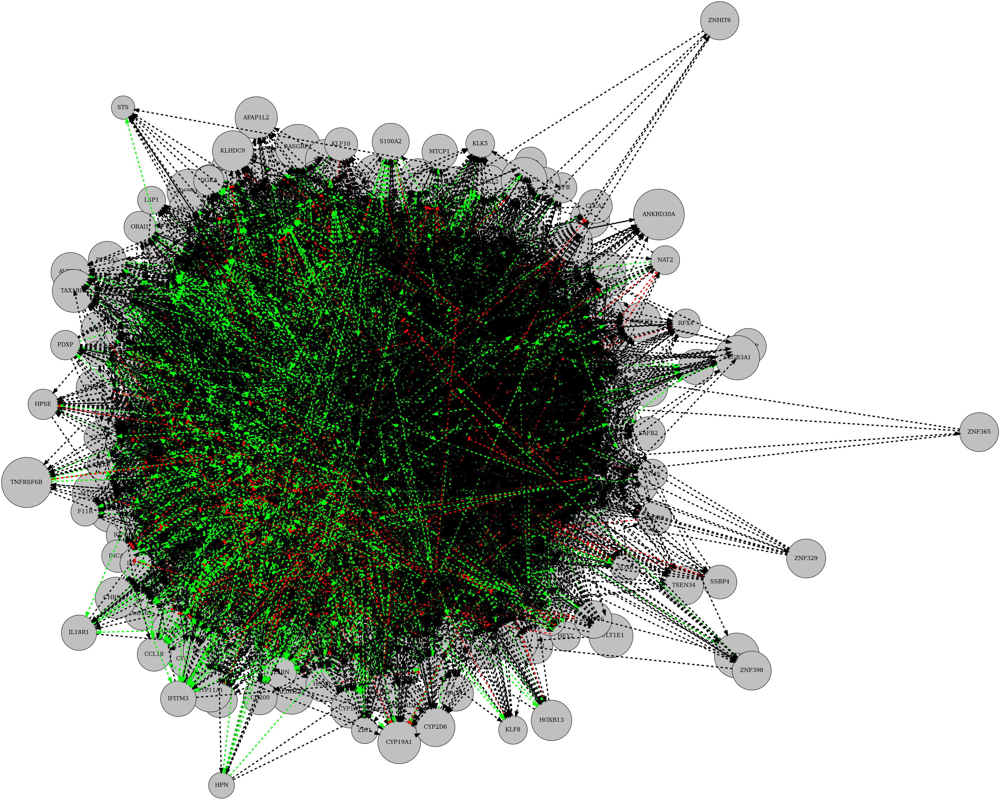

In [25]:
plot_influence_graph(final_network1842145_trimmed_thresf, "preferredName_A", 
    "preferredName_B", "sign", direction_col="directed", fname="data_BreastCancer/graph_final", optional=True)
Image(filename='data_BreastCancer/graph_final.png') 

Restrict the network to signed edges (either tagged as activatory or inhibitory):

In [26]:
net = final_network1842145_trimmed_thresf.loc[(final_network1842145_trimmed_thresf["sign"]!=2)]
net = net.sort_values(by="score", ascending=False)
net = remove_isolated(net, quiet=True)
net

,preferredName_A,preferredName_B,sign,directed,score
0,IL2RA,IL2,1,0,0.999
7,SMAD2,SMAD4,1,0,0.999
17,TNFSF11,TNFRSF11A,1,0,0.999
18,PTPN11,IRS1,1,0,0.999
19,PTPN11,GAB1,1,0,0.999
...,...,...,...,...,...
73328,CTNND1,RAC3,1,0,0.151
73401,NR0B2,PRKACB,1,0,0.151
73419,PIK3CB,VDR,1,0,0.151
73237,CDK4,POLE,1,0,0.151


### I.d Reduce the number of edges by filtering on score, and keep the network connected

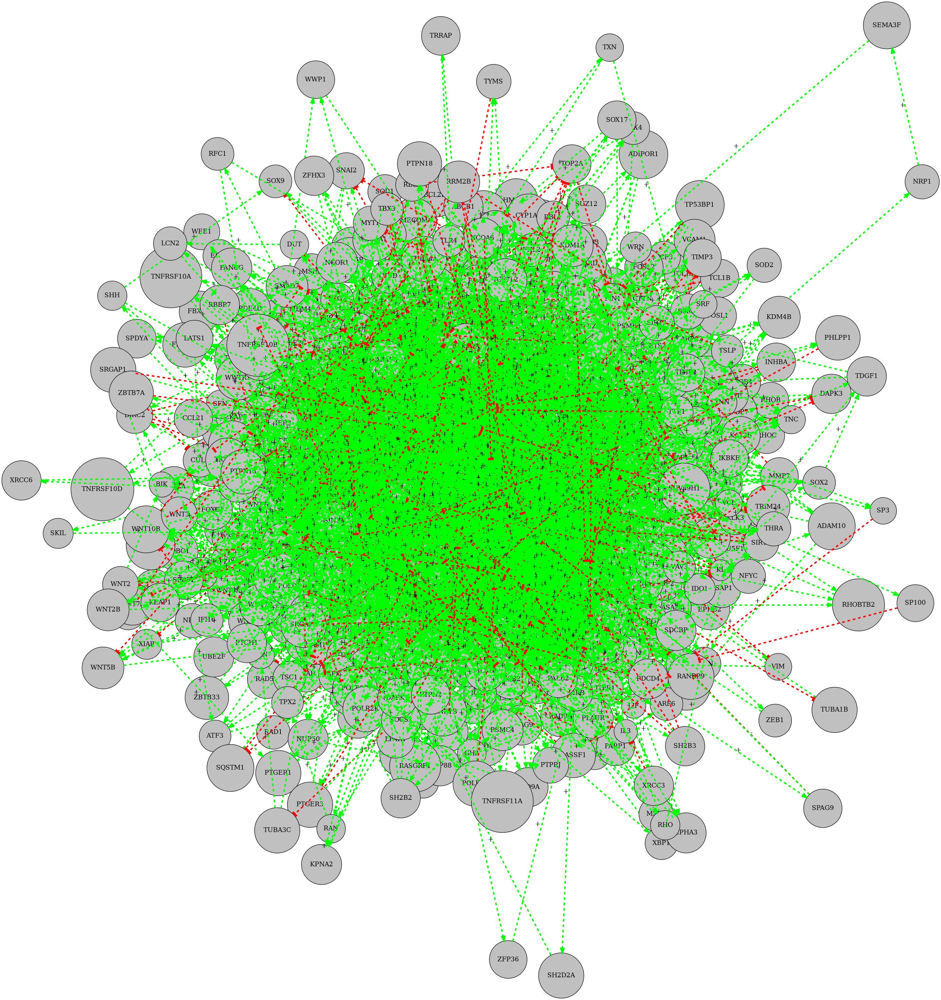

In [29]:
score=0.6
NETWORK_fname = "data_BreastCancer/full_1842145net_score=%.1f.tsv" % score

if (not os.path.exists(NETWORK_fname)):
    gene_list145 = str(sbcheck_output("sed \"s/,/\\n/g\" data_BreastCancer/gene_list.txt | sed \"s/ /\\n/g\" | sed -r \"/^$/d\" | sed \"/(*)/d\"", shell=True).decode("utf-8")).split("\n")
    NETWORK_fname_ = "data_BreastCancer/full_1842145net.tsv"
    net = pd.read_csv(NETWORK_fname_, sep="\t")

    net = net.loc[net["score"]>score]

    glist_net = list(set(list(net["preferredName_A"])+list(net["preferredName_B"])))
    components_net = get_weakly_connected(net, glist_net, score_col="score")

    ## Criteria for selecting the score
    print("Genes RB1 and BRCA1 belong to the largest connected component (CC) %s" % str(all([x in components_net[0] for x in ["RB1","BRCA1"]])))
    print("Number of core 145 genes that belong to the largest CC %d" % sum([int(x in components_net[0]) for x in gene_list145]))
    is_comp0 = np.vectorize(lambda x : x in components_net[0])
    net = remove_isolated(net, quiet=True)

    net.to_csv(NETWORK_fname, sep="\t", index=None)
net = pd.read_csv(NETWORK_fname, sep="\t")
plot_influence_graph(net, "preferredName_A", "preferredName_B", "sign", direction_col="directed", 
                     fname="data_BreastCancer/net", optional=True)
Image(filename='data_BreastCancer/net.png') 

## II. Network identification

Please refer to the introductory notebook in the [GitHub repository](https://github.com/clreda/nordic) for more information about the parameters.

### II.a Running the network identification pipeline from NORDic NI

In [34]:
from multiprocessing import cpu_count
from NORDic.NORDic_NI.functions import network_identification, solution2cytoscape
from NORDic.UTILS.utils_grn import load_grn, solution2influences, reconnect_network
from NORDic.UTILS.utils_plot import influences2graph

In [2]:
file_folder="Breast_Cancer/"

## Registration to databases
DisGeNET_credentials = "../NetworkOrientedRepurposingofDrugs/tests/credentials_DISGENET.txt"
STRING_credentials = "../NetworkOrientedRepurposingofDrugs/tests/credentials_STRING.txt"
LINCS_credentials = "../NetworkOrientedRepurposingofDrugs/tests/credentials_LINCS.txt"

## Parameters
seed_number=123456
njobs=max(1,cpu_count()-2)
taxon_id=9606 # human species
disease_cids=["C0006142"] # Breast cancer; Malignant breast neoplasm
cell_lines=["MCF7"]

## Information about the disease
DISGENET_args = {"credentials": DisGeNET_credentials, "disease_cids": disease_cids}

## Selection of parameters relative to the prior knowledge network 
STRING_args = {"credentials": STRING_credentials, "score": 0, "version": "11.5"}
EDGE_args = {"tau": 0, "filter": True, "connected": True}

## Selection of parameters relative to experimental constraints
LINCS_args = {"path_to_lincs": "../NetworkOrientedRepurposingofDrugs/lincs/", 
        "credentials": LINCS_credentials, "cell_lines": cell_lines, "thres_iscale": None,
             "pert_types": ["trt_sh"]}
SIG_args = {"bin_thres": 0.5}

## Selection of parameters relative to the inference of networks
BONESIS_args = {"limit": 1, "exact": True, "max_maxclause": 2}

## Advanced
DESIRABILITY = {"DS": 3, "CL": 3, "Centr": 3, "GT": 1}

path_to_genes = None

EDGE_args.update({"tau": 0., "filter": False, "beta": 1, "connected": True})
STRING_args.update({"score": 0})
LINCS_args.update({"thres_iscale": 0.155})
SIG_args.update({"bin_thres": 0.055})
BONESIS_args.update({"limit": 500, "exact": False, "max_maxclause": 2})

solution = network_identification(file_folder, taxon_id, path_to_genes=path_to_genes, disgenet_args=DISGENET_args, 
    string_args=STRING_args, lincs_args=LINCS_args, edge_args=EDGE_args, sig_args=SIG_args, 
    bonesis_args=BONESIS_args, weights=DESIRABILITY, seed=seed_number, network_fname=NETWORK_fname, njobs=njobs, 
    force_experiments=True, accept_nonRNA=False, preserve_network_sign=True)

--- DATA IMPORT ---
1. Import gene set from DisGeNET... ... 929 genes imported.
2. Import network from data_BreastCancer/full_1842145net_score=0.6.tsv... ... 6236 edges in model (including 786 directed edges) with a total of 929 non-isolated genes
3. Import experiments from LINCS L1000... 
	1 cell lines are considered (['MCF7'])
	567 genes available (convertable to EntrezIDs)
		Check that
		1. All input genes are HUGO Gene Symbols / Ensembl IDs / HGNC IDs / STRING IDs;
		2. The correct taxon id (9606) was provided.
		564/567 genes retrieved in LINCS L1000
... 537 genes in 395 profiles (62 experiments)

--- CONSTRAINT BUILDING ---
1. Filtering out edges by minimum set of edges with highest score which preserve connectivity... ... 3662 unique edges involving genes both in experiments (525 genes in total)
... score_STRING 0.000000	525 genes (non isolated in PPI)	6306 edges in PPI
2. Build topological constraints from filtered edges using gene expression data...  ...... 297 negative, 6009 

  0%|                                                                                | 0/1 [00:00<?, ?it/s]

Grounding...done in 18.8s
Found 500 solutions in 5395.3s (first in 129.5s; rate 10.8s)

100%|████████████████████████████████████████████████████████████████████| 1/1 [1:30:24<00:00, 5424.10s/it]


--- SELECTION OF OPTIMAL MODEL ---
A. Select an optimal model based on a topological criteria...  ...500 solutions (500 unique solutions)
... 500 solutions (352/526 constant genes in average)
<MODEL VISUALIZATION> Minimal solution: 214 edges
<MODEL VISUALIZATION> Maximal solution: 596 edges
          1         2         3         4         5         6         7    \
GTP  0.806276  0.800919  0.811143  0.814542  0.787295  0.800896  0.807162   

          8         9         10        11        12        13        14   \
GTP  0.802947  0.807095  0.813954  0.809087  0.806276  0.796472  0.808351   

          15        16        17        18        19        20        21   \
GTP  0.811023  0.787295  0.811041  0.802593  0.810629  0.787295  0.787382   

          22        23        24        25        26        27       28   \
GTP  0.787846  0.806358  0.807381  0.787159  0.797588  0.802732  0.80614   

          29        30        31        32        33        34        35   \
GTP  0.813696

<MODEL SELECTION> Saving optimal model in 'MCF7_Cancer_1842+145//solution.bnet' ...
ABI1, 1
ABL1, 0
ABL2, RAC3
AKT1, (AKT2&CHUK&HIF1A)|(HSP90AA1&!PML&SOD2)
AKT2, TSC1|(HSP90AA1&HSP90AB1)
...
... saved!


Convert to Cytoscape-readable files:

In [4]:
solution = load_grn(file_folder+"solution.bnet")
solution2cytoscape(solution, file_folder+"solution_cytoscape")

### II.b Reduce the size of the network for computational reasons (remove isolated genes)

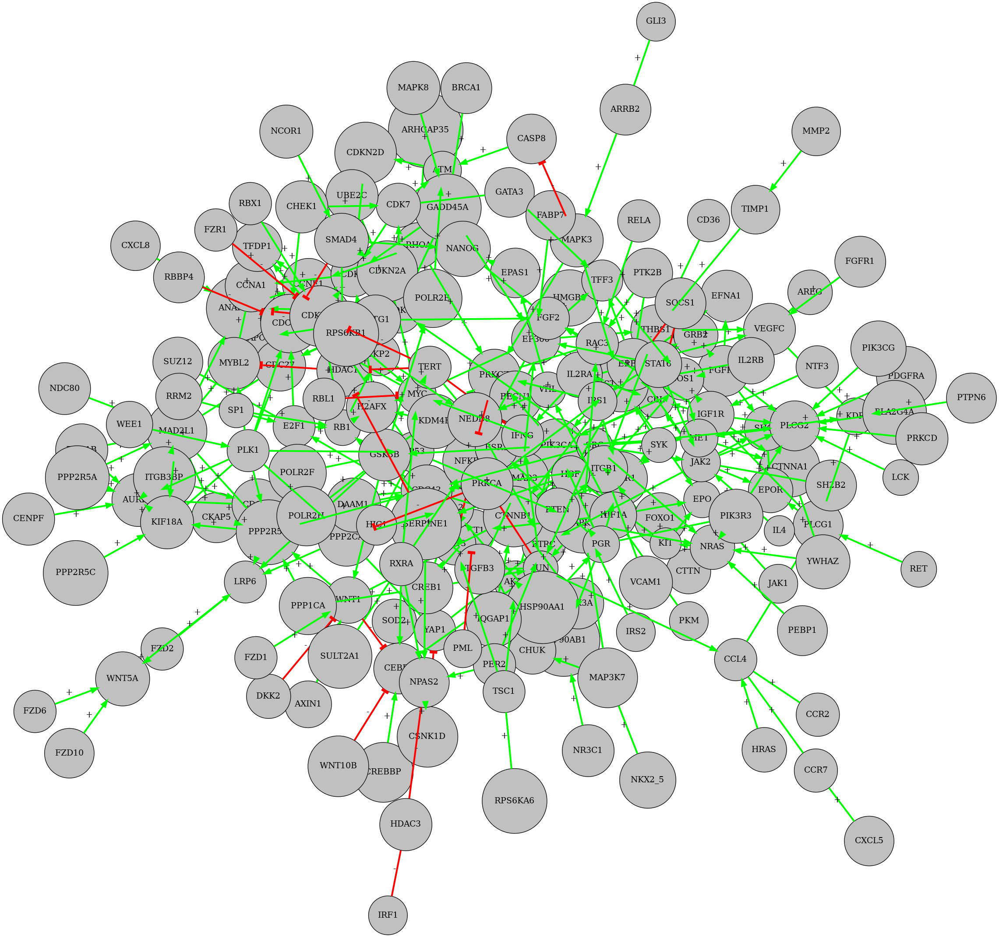

In [35]:
if (not os.path.exists(file_folder+"solution_connected.bnet")):
    network_fname = reconnect_network(file_folder+"solution.bnet") ## creates the "solution_connected.bnet" file
network_fname = file_folder+"solution_connected.bnet"
with open(network_fname, "r") as f:
    network_connected = pd.DataFrame({"Solution": dict([["_".join(g.split("-")) for g in x.split(", ")] for x in f.read().split("\n") if (len(x)>0)])})
influences_connected = solution2influences(network_connected["Solution"])
influences2graph(influences_connected, file_folder+"network_connected", optional=False, compile2png=True, engine=["sfdp","dot"][0])
from IPython.display import Image
Image(filename=file_folder+'network_connected.png') 